In [29]:
# load necessary package

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler

import keras
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
import matplotlib.pyplot as plt

In [30]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [31]:
dataPath = "/Users/qinxi/Documents/5470/m5-forecasting-accuracy/"
timesteps = 14
startDay = 350

In [32]:
dt = pd.read_csv(dataPath + "/sales_train_evaluation.csv")
dt.shape

(30490, 1947)

In [33]:
saleste_data = pd.read_csv(dataPath +'/sales_train_evaluation.csv') # main information during d_1 - d_1941
salestv_data = pd.read_csv(dataPath +'/sales_train_validation.csv') # main information during d_1 - d_1913, ground truth of validation is provided in train_sales
cal_data = pd.read_csv(dataPath +'/calendar.csv')                   # calendar data
sellp_data = pd.read_csv(dataPath +'/sell_prices.csv')              # the price of products
# submission file
ss_data = pd.read_csv(dataPath +'/sample_submission.csv')

In [34]:
# float --> int
salestv_data_save = salestv_data
float_data = [column for column in salestv_data_save if salestv_data_save[column].dtype == 'float64']
int_data = [column for column in salestv_data_save if salestv_data_save[column].dtype in ['int32', 'int64']]
salestv_data_save[float_data] = salestv_data_save[float_data].astype(np.float32)
salestv_data_save[int_data] = salestv_data_save[int_data].astype(np.int16)
print(salestv_data_save.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1919 entries, id to d_1913
dtypes: int16(1913), object(6)
memory usage: 112.6+ MB
None


In [35]:
# get the data in exact format with dates as rows
salestv_data_save = salestv_data_save.T
salestv_data_save.shape
salestv_data_save.head(10)

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
id,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_818_WI_3_validation,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation
item_id,HOBBIES_1_001,HOBBIES_1_002,HOBBIES_1_003,HOBBIES_1_004,HOBBIES_1_005,HOBBIES_1_006,HOBBIES_1_007,HOBBIES_1_008,HOBBIES_1_009,HOBBIES_1_010,...,FOODS_3_818,FOODS_3_819,FOODS_3_820,FOODS_3_821,FOODS_3_822,FOODS_3_823,FOODS_3_824,FOODS_3_825,FOODS_3_826,FOODS_3_827
dept_id,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,...,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3
cat_id,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,...,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS
store_id,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,...,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3
state_id,CA,CA,CA,CA,CA,CA,CA,CA,CA,CA,...,WI,WI,WI,WI,WI,WI,WI,WI,WI,WI
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0


In [36]:
#remove first 6 rows no need
salestv_data_save = salestv_data_save[6:]
salestv_data_save.head(10)

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
d_5,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
d_6,0,0,0,0,0,0,0,4,2,0,...,0,13,2,0,7,3,5,4,0,0
d_7,0,0,0,0,0,0,0,6,3,0,...,0,18,1,0,8,1,0,1,0,0
d_8,0,0,0,0,0,0,0,5,9,0,...,0,13,3,0,4,4,1,8,0,0
d_9,0,0,0,0,0,0,0,7,0,0,...,0,18,4,0,4,1,1,5,0,0
d_10,0,0,0,0,0,0,0,0,0,0,...,0,19,1,0,1,0,3,2,0,0


In [37]:
daysBeforeEvent = pd.DataFrame(np.zeros((1969,8)))

In [38]:
for x, y in cal_data.iterrows():
    if x!=0 and (pd.isnull(cal_data['event_name_1'][x]) == False):
        daysBeforeEvent[0][x-1]=1
    if x!=0 and (pd.isnull(cal_data['event_name_2'][x]) == False):
        daysBeforeEvent[1][x-1]=1
    if x!=0:
        daysBeforeEvent[2][x-1]=cal_data['wday'][x]
    if x!=0:
        daysBeforeEvent[3][x-1]=cal_data['month'][x]
    if x!=0:
        daysBeforeEvent[4][x-1]=cal_data['year'][x]
    if x!=0:
        daysBeforeEvent[5][x-1]=cal_data['snap_CA'][x]
    if x!=0:
        daysBeforeEvent[6][x-1]=cal_data['snap_TX'][x]
    if x!=0:
        daysBeforeEvent[7][x-1]=cal_data['snap_WI'][x]

/var/folders/zd/m4vm41j95rg2m1rbs5dcsm7h0000gn/T/ipykernel_15793/2210015409.py:7: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  daysBeforeEvent[2][x-1]=cal_data['wday'][x]
/var/folders/zd/m4vm41j95rg2m1rbs5dcsm7h0000gn/T/ipykernel_15793/2210

In [53]:
daysBeforeTest = daysBeforeEvent[1913:1941]
daysBeforeTrain = daysBeforeEvent[0:1913]
# print(daysBeforeTest.shape)
# print(daysBeforeTest)

In [54]:
daysBeforeTrain.columns = ['oneDayBeforeEvent1','oneDayBeforeEvent2','oneDayBeforewday','oneDayBeforemonth','oneDayBeforeyear','oneDayBeforesnap_CA','oneDayBeforesnap_TX','oneDayBeforesnap_WI']
daysBeforeTrain.index = salestv_data_save.index

In [41]:
final_data = pd.concat([salestv_data_save, daysBeforeTrain], axis=1)
# print(final_data)

In [42]:
sc = MinMaxScaler(feature_range=(0,1))
final_data.columns = final_data.columns.astype(str)
final_data_scaled = sc.fit_transform(final_data)
print(final_data_scaled)
final_data_scaled.shape

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 1.         1.         0.        ]
 ...
 [0.         0.         0.16666667 ... 0.         0.         0.        ]
 [0.2        0.         0.16666667 ... 0.         0.         0.        ]
 [0.2        0.         0.16666667 ... 0.         0.         0.        ]]


(1913, 30498)

In [43]:
X_train = []
y_train = []

for i in range(14,1913):
    X_train.append(final_data_scaled[i-14:i])
    y_train.append(final_data_scaled[i][0:30490])

In [44]:
X_eval=np.array(X_train[int(0.9*len(X_train)):])
y_eval=np.array(y_train[int(0.9*len(y_train)):])
print(X_eval.shape)
print(y_eval.shape)

(190, 14, 30498)
(190, 30490)


In [45]:
X_train = np.array(X_train[:int(0.9*len(X_train))])
y_train = np.array(y_train[:int(0.9*len(y_train))])
print(X_train.shape)
print(y_train.shape)

(1709, 14, 30498)
(1709, 30490)


In [46]:
class LossHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.losses = {'batch':[], 'epoch':[]}
        self.val_loss = {'batch':[], 'epoch':[]}

    def on_batch_end(self, batch, logs={}):
        self.losses['batch'].append(logs.get('loss'))
        self.val_loss['batch'].append(logs.get('val_loss'))

    def on_epoch_end(self, batch, logs={}):
        self.losses['epoch'].append(logs.get('loss'))
        self.val_loss['epoch'].append(logs.get('val_loss'))

    def loss_plot(self, loss_type):
        iters = range(len(self.losses[loss_type]))
        plt.figure()
        plt.plot(iters, self.losses[loss_type], 'g', label='train loss')
        if loss_type == 'epoch':
            plt.plot(iters, self.val_loss[loss_type], 'r', label='val loss')
        plt.grid(True)
        plt.xlabel(loss_type)
        plt.ylabel('mse-loss')
        plt.legend(loc="upper right")
        plt.savefig('./epoch_loss.jpg')
        plt.show()

/Users/qinxi/anaconda3/envs/myenv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0154 - mse: 0.0154 - val_loss: 0.0197 - val_mse: 0.0197
Epoch 2/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0133 - mse: 0.0133 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 3/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0128 - mse: 0.0128 - val_loss: 0.0188 - val_mse: 0.0188
Epoch 4/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.0126 - mse: 0.0126 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 5/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 6/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 7/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 8/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 134ms/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 9/60
39/39 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - lo

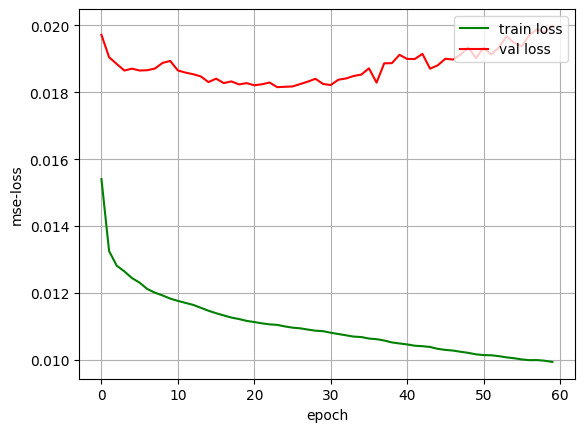

In [47]:
regressor = Sequential()

layer_1_units = 40
regressor.add(LSTM(units=layer_1_units, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
regressor.add(Dropout(0.2))

layer_2_units = 300
regressor.add(LSTM(units=layer_2_units, return_sequences=True))
regressor.add(Dropout(0.2))

layer_3_units = 300
regressor.add(LSTM(units=layer_3_units))
regressor.add(Dropout(0.2))

regressor.add(Dense(units=30490))

regressor.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

epoch_no = 60  # 20 is the best
batch_size_RNN = 44
history = LossHistory()
regressor.fit(X_train, y_train, validation_data=(X_eval, y_eval), epochs=epoch_no, batch_size=batch_size_RNN,
              callbacks=[history])
history.loss_plot('epoch')

In [48]:
inputs = final_data[-14:]
inputs = sc.transform(inputs)
print(inputs)

[[0.         0.         0.         ... 0.         1.         1.        ]
 [0.         0.         0.         ... 0.         1.         0.        ]
 [0.         0.         0.16666667 ... 0.         0.         1.        ]
 ...
 [0.         0.         0.16666667 ... 0.         0.         0.        ]
 [0.2        0.         0.16666667 ... 0.         0.         0.        ]
 [0.2        0.         0.16666667 ... 0.         0.         0.        ]]


In [55]:
X_test = []
X_test.append(inputs[0:14])
X_test = np.array(X_test)
print(X_test.shape)
predictions = []
daysBeforeTest = np.array(daysBeforeEvent[1913:1941])
daysBeforeTrain = np.array(daysBeforeEvent[0:1913])


(1, 14, 30498)


In [56]:

for j in range(14, 42):
    predicted_sales = regressor.predict(X_test[0, j-14:j].reshape(1, 14,30498))
    testInput = np.column_stack((np.array(predicted_sales), daysBeforeTest[:][j-14].reshape(1,-1)))
    X_test = np.append(X_test, testInput).reshape(1, j+1, 30498)
    predicted_sales = sc.inverse_transform(testInput)[:,0:30490]
    predictions.append(predicted_sales)
print(testInput.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━

In [57]:
predictions[0].shape

(1, 30490)

In [59]:
submission = pd.DataFrame(data=np.array(predictions).reshape(28,30490))
submission = submission.T
submission = pd.concat((submission, submission), ignore_index=True)

submission[['id']] = ss_data[['id']]

cols = list(submission.columns)
cols = cols[-1:]+cols[:-1]
submission = submission[cols]

colsdname = ['id'] + [f'F{i}' for i in range(1,29)]
submission.columns = colsdname

submission.to_csv('submission1.csv', index=False)